c:\Users\23148\miniconda3\Lib\site-packages\pydub\utils.py:170: RuntimeWarning: Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work
  warn("Couldn't find ffmpeg or avconv - defaulting to ffmpeg, but may not work", RuntimeWarning)


[[ 0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00 -3.05175781e-05]
 [-3.05175781e-05  3.05175781e-05]
 ...
 [ 0.00000000e+00  0.00000000e+00]
 [ 3.05175781e-05  0.00000000e+00]
 [ 0.00000000e+00  0.00000000e+00]]
44100


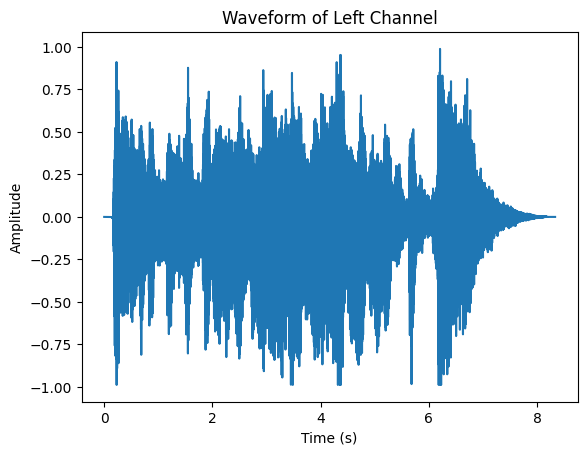

In [1]:
import numpy as np
from pydub import AudioSegment
import soundfile as sf
import IPython.display as ipd
from reverberation import Reverberation

# 定义延迟线函数，处理立体声信号

# 设置参数
delay_samples = 5000  # 回声延迟的样本数
gain = 0.8  # 相对增益因子

# 读取输入音频文件
input_filename = "../musicpiece/mixkit-medieval-show-fanfare-announcement-226.wav"
samples, samplerate = sf.read(input_filename)
print(samples)
print(samplerate)

audio1 = ipd.Audio(input_filename)
ipd.display(audio1)

output=Reverberation(samples,samplerate)
import matplotlib.pyplot as plt

# Extract the left channel samples
left_channel = samples[:, 0]

# Create the time axis
time = np.arange(len(left_channel)) / samplerate

# Plot the waveform
plt.plot(time, left_channel)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of Left Channel')
plt.show()

In [4]:
max_delay = np.max(samples)
print(max_delay)

0.20133554935455322


## FeedForward CombFilter

### 一次回声效果

In [2]:
# 应用延迟效果
output.echo(delay_samples, gain)
delayed_samples = output.delayed_samples

# 写入输出音频文件
output_filename = 'echoed.wav'
sf.write(output_filename, delayed_samples, samplerate)

# 展示音频

audio = ipd.Audio(output_filename)
ipd.display(audio)
print(delayed_samples)

[[0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 ...
 [0.00010033 0.00017462]
 [0.00011177 0.00016088]
 [0.00012331 0.00013056]]


In [3]:
output.dealing_samples=samples
output.FFCF(delay_samples, gain)
delayed_samples = output.delayed_samples
output_filename="ffcf.wav"
sf.write(output_filename, delayed_samples, samplerate)
audio = ipd.Audio(output_filename)
ipd.display(audio)
print(delayed_samples)

[[0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 ...
 [0.00010033 0.00017462]
 [0.00011177 0.00016088]
 [0.00012331 0.00013056]]


### 两次回声效果

In [4]:
output.echo_twice(delay_samples*2, gain)
delayed_samples = output.delayed_samples
output_filename="echoed_twice.wav"
sf.write(output_filename, delayed_samples, samplerate)
audio = ipd.Audio(output_filename)
ipd.display(audio)


## FeedBack Comb Filter

In [5]:
output.dealing_samples = samples
delay_samples = 901
gain = 0.8051
output.feedback_combfilter(delay_samples, gain)
delayed_samples = output.delayed_samples
output_filename="feedback.wav"
print(output.samples)
print(delayed_samples)
sf.write(output_filename, delayed_samples, samplerate)
audio = ipd.Audio(output_filename)
ipd.display(audio)

[[0. 0.]
 [0. 0.]
 [0. 0.]
 ...
 [0. 0.]
 [0. 0.]
 [0. 0.]]
[[0.         0.        ]
 [0.         0.        ]
 [0.         0.        ]
 ...
 [0.00447776 0.00898104]
 [0.00368052 0.00834887]
 [0.00140504 0.00709615]]


In [2]:
output.dealing_samples = samples
delay_samples = 901
gain = 0.8051
output.FBCF(delay_samples, gain)
delayed_samples = output.delayed_samples
print(delayed_samples)
output_filename="FBCF.wav"
sf.write(output_filename, delayed_samples, samplerate)
audio = ipd.Audio(output_filename)
ipd.display(audio)

[[ 0.00000000e+00  0.00000000e+00]
 [ 0.00000000e+00 -3.05175781e-05]
 [-3.05175781e-05  3.05175781e-05]
 ...
 [ 3.23853472e-04  2.67381094e-06]
 [ 3.70680921e-04 -2.73172498e-05]
 [ 3.34203043e-04 -4.71236678e-05]]


## Allpass Filter

In [7]:
output.dealing_samples = samples
gain = 0.7
N=347
output.AP(N, gain)
delayed_samples = output.delayed_samples
output_filename="allpass.wav"
sf.write(output_filename, delayed_samples, samplerate)
audio = ipd.Audio(output_filename)
ipd.display(audio1)
ipd.display(audio)
print(delayed_samples)

[[0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00]
 ...
 [1.20679417e-05 6.51241766e-06]
 [2.51428108e-06 2.68236062e-06]
 [2.16040897e-06 5.17500567e-06]]


In [8]:
output.dealing_samples = output.samples
gain = 0.7
N=347
output.allpass_filter(N, gain)
delayed_samples = output.delayed_samples
output_filename="allpass.wav"
sf.write(output_filename, delayed_samples, samplerate)
audio = ipd.Audio(output_filename)
ipd.display(audio1)
ipd.display(audio)
print(delayed_samples)

[[0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00]
 ...
 [1.20679417e-05 6.51241766e-06]
 [2.51428108e-06 2.68236062e-06]
 [2.16040897e-06 5.17500567e-06]]


## Schroeder Reverberators

In [9]:
output.dealing_samples = samples
output.SATREV()
delayed_samples = output.delayed_samples
max_delay = np.max(delayed_samples)
delayed_samples = delayed_samples / max_delay

output_filename="satrev.wav"
sf.write(output_filename, delayed_samples, output.samplerate)
audio = ipd.Audio(output_filename)
ipd.display(audio1)
ipd.display(audio)

1.0


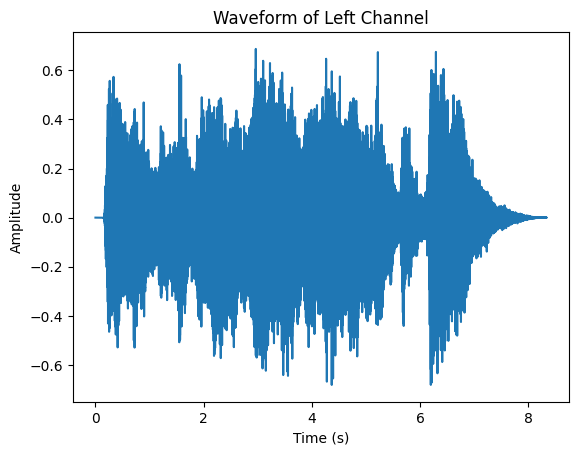

In [10]:
output.dealing_samples = samples
output.JCREV()
delayed_samples = output.delayed_samples
max_delay = np.max(delayed_samples)
delayed_samples = delayed_samples / max_delay
import numpy as np

max_delay = np.max(delayed_samples)
print(max_delay)
output_filename="jcrev.wav"
sf.write(output_filename, delayed_samples, output.samplerate)
audio = ipd.Audio(output_filename)
ipd.display(audio1)
ipd.display(audio)

# Extract the left channel samples
left_channel1 = delayed_samples[:, 0]

# Create the time axis
time = np.arange(len(left_channel1)) / samplerate

# Plot the waveform
plt.plot(time, left_channel1)
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Waveform of Left Channel')
plt.show()

In [11]:
output.dealing_samples = samples
output.JCREV2()
delayed_samples = output.delayed_samples
max_delay = np.max(delayed_samples)
delayed_samples = delayed_samples / max_delay
output_filename="jcrev2.wav"
sf.write(output_filename, delayed_samples, output.samplerate)
audio = ipd.Audio(output_filename)
ipd.display(audio1)
ipd.display(audio)

44100->25000

In [ ]:
from scipy import signal  
  
# 目标采样频率为25000Hz  
target_sample_rate = 25000  

resampled_samples = np.zeros((int(samples.shape[0] * target_sample_rate / samplerate), samples.shape[1]))
# 使用scipy的resample函数进行重采样，指定axis=0以保持双声道结构  
for i in range(0,samples.shape[1]):
    resampled_samples[:,i] = signal.resample(samples[:,i], int(samples.shape[0] * target_sample_rate / samplerate))  

output2_filename="rrsatrev2.wav"
sf.write(output2_filename, resampled_samples, 25000)
audio2 = ipd.Audio(output2_filename)
ipd.display(audio2)
  
output2=Reverberation(resampled_samples, target_sample_rate)
output2.SATREV()
delayed_samples2 = output2.delayed_samples
output_filename="satrev2.wav"
sf.write(output_filename, delayed_samples2, 25000)
audio = ipd.Audio(output_filename)
ipd.display(audio)